#CafChem tools for exploratory data analysis (EDA)

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/MauricioCafiero/CafChem/blob/main/notebooks/EDA_CafChem.ipynb)

## This notebook allows you to:
- Upload a SMILES dataset and featurize it with RDKit or Mordred features or fingerprints (you can use your own features as well)
- perform and view a plot of either PCA or t-SNE dimension reduction analysis in 2 dimensions.
- perform analysis with Autoviz

## Requirements:
- This notebook will install rdkit, deepchem, autoviz and mordred.
- Will run fine on a CPU.

## Set-up
- will require a restart

### Install RDKit

In [1]:
!pip uninstall numpy -y
!pip install numpy==1.26.4

Found existing installation: numpy 2.0.2
Uninstalling numpy-2.0.2:
  Successfully uninstalled numpy-2.0.2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 113.8 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
jaxlib 0.7.2 requires numpy>=2.0, but you have numpy 1.26.4 which is incompatible.
opencv-contrib-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
jax 0.7.2 requires numpy>=2.0, but you have numpy 1.26.4 which is incompatible.
opencv-python-headless 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
opencv-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
pytenso

In [1]:
!pip install -q rdkit
! pip install -q deepchem
! pip install -q mordred
!pip install -q autoviz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 552.4/552.4 kB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.8/128.8 kB 4.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 39.5 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
nx-cugraph-cu12 25.6.0 requires networkx>=3.2, but you have networkx 2.8.8 which is incompatible.
scikit-image 0.25.2 requires networkx>=3.0, but you have networkx 2.8.8 which is incompatible.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.5/67.5 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.5/175.5 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 255.9/255.9 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 608.4/608.4 kB 47.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

### Import Libraries

In [3]:
!git clone https://github.com/MauricioCafiero/CafChem.git

Cloning into 'CafChem'...
remote: Enumerating objects: 1061, done.
remote: Counting objects: 100% (383/383), done.
remote: Compressing objects: 100% (126/126), done.
remote: Total 1061 (delta 343), reused 257 (delta 257), pack-reused 678 (from 1)
Receiving objects: 100% (1061/1061), 44.86 MiB | 40.44 MiB/s, done.
Resolving deltas: 100% (624/624), done.


In [5]:
import numpy as np
np.__version__

'2.0.2'

In [4]:
import numpy as np
import pandas as pd
from rdkit import Chem
from rdkit.Chem import AllChem, Draw, Descriptors
import matplotlib.pyplot as plt

from autoviz import AutoViz_Class
import CafChem.CafChemEDA as ccda

%matplotlib inline

print("All libraries loaded!")

Imported v0.1.905. Please call AutoViz in this sequence:
    AV = AutoViz_Class()
    %matplotlib inline
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)


wandb: WARNING W&B installed but not logged in.  Run `wandb login` or set the WANDB_API_KEY env variable.
Instructions for updating:
experimental_relax_shapes is deprecated, use reduce_retracing instead
wandb: WARNING W&B installed but not logged in.  Run `wandb login` or set the WANDB_API_KEY env variable.


All libraries loaded!


## Load Data

In [5]:
input_filepath = '/content/Tyrosinase1239_IC50.csv'

In [6]:
df = pd.read_csv(input_filepath, )
df.head()

,SMILES,IC50
0,COc1cc(/C=C/C(=O)NCCc2c[nH]c3ccc(O)cc23)ccc1O,216000.0
1,O=C(NCCc1c[nH]c2ccc(O)cc12)c1ccc(O)cc1O,42000.0
2,CC(C)=CCc1c(O)cc2c(c1O)C(=O)CC(c1ccc(O)c(O)c1CC=C(C)C)O2,750.0
3,C=CC(C)(C)c1cc(C2CC(=O)c3c(O)cc(O)c(CC=C(C)C)c3O2)c(O)cc1O,1000.0
4,O=C(/C=C/c1ccc(O)c(O)c1)NCCc1c[nH]c2ccc(O)cc12,28000.0


### Make classes if target is a continuous value

In [10]:
df_class = ccda.make_classes(input_filepath, 'IC50', 3)
df_class.head()

Samples per class: 413, total samples:1239


,SMILES,IC50,class labels
1051,COc1ccccc1-c1nnc(SCC(=O)Nc2ccccc2)o1,3.00,3.0 < 3510.0
103,COc1cc(C2CC(c3cc4ccccc4oc3=O)=NN2c2nc(-c3ccc(Br)cc3)cs2)ccc1OCc1ccccc1,4.58,3.0 < 3510.0
879,Oc1ccc(-c2nc3ccccc3s2)c(O)c1,10.00,3.0 < 3510.0
480,CCN(CC)C(=O)/C=C/c1ccc(O)cc1O,11.20,3.0 < 3510.0
481,COc1ccccc1-c1nnc(SCC(=O)Nc2ccc(F)cc2)o1,18.00,3.0 < 3510.0


In [12]:
f, y, smiles = ccda.featurize(df_class["SMILES"].to_list(), df_class["class labels"].to_list(), featurizer="rdkit")

Row 252 has a NaN.
Old dimensions are: (1239, 217).
Deleting row 252 from arrays.
New dimensions are: (1238, 217)


## Dimensional Reduction Analysis
- use 'P' for PCA dimension reduction and 't' for t-SNE dimension reduction

Outliers found in the following locations: (array([ 124,  305,  328,  672,  719,  735,  757,  792,  815,  816,  833,
       1061, 1212]),) using f.
Starting outlier removal.
New dimensions are: (1225, 217); removed 13 outliers
target converted to ints
Shape is: (1225, 2)
Number of labels: 3


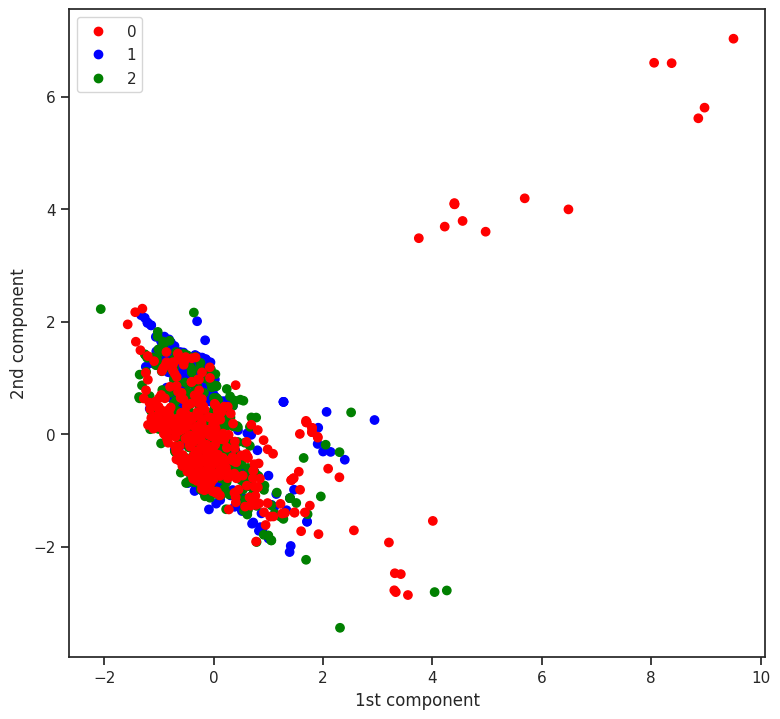

In [14]:
ccda.dimreduction(f, y, 'P', whiten=True)

Outliers found in the following locations: (array([ 172,  226,  305,  461,  532,  549,  588,  644,  893,  972, 1021,
       1175, 1179]),) using f.
Starting outlier removal.
New dimensions are: (1225, 217); removed 13 outliers
target converted to ints
KL divergence: 0.6319150328636169
Shape is: (1225, 2)
Number of labels: 3


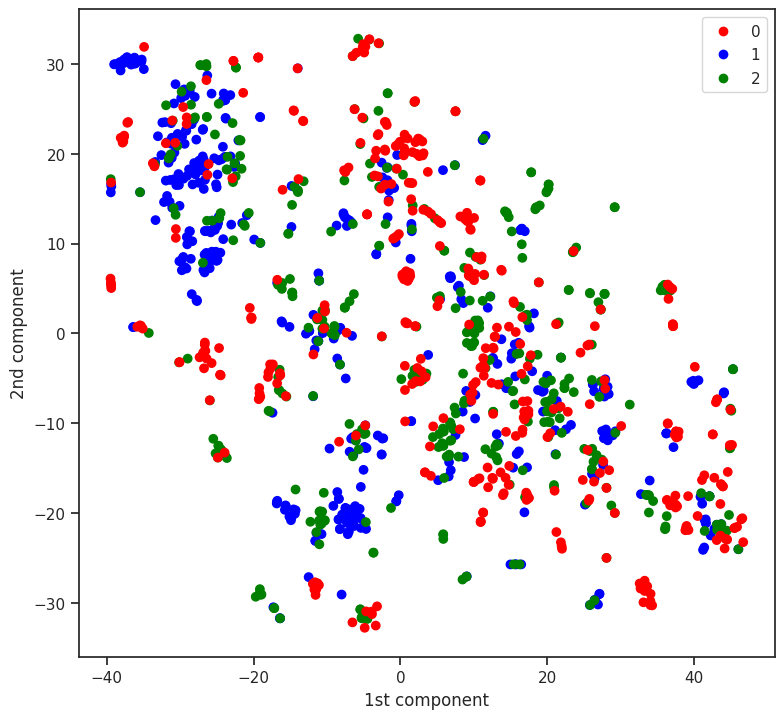

In [15]:
ccda.dimreduction(f, y, 't', perplexity=50)

## Autoviz analysis
-first, scale and apply PCA to the features
- verbose can be set to 0 (fewer charts), 1 (more charts), 2 (charts saved only)

In [17]:
pca_f = ccda.scale_pca(f, True, True, 20)
f, y = ccda.remove_outliers(pca_f,y)

Pre-processing done.
Outliers found in the following locations: (array([  50,  226,  588,  644,  704,  972,  990,  992, 1016, 1021, 1032,
       1041, 1058]),) using f.
Starting outlier removal.
New dimensions are: (1225, 20); removed 13 outliers


In [18]:
feat_df = ccda.create_feature_df(f, y)
feat_df.head()

target converted to ints
(1225, 20)


,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,target
0,-0.402629,-0.715610,5.336319,-2.785791,1.271036,2.293825,-0.456524,0.414382,1.480405,1.146110,0.798777,0.499628,-0.709457,-1.315458,3.326094,1.660656,-0.863832,0.893004,-0.270207,-0.606255,1
1,8.157196,-4.042757,11.454720,-9.733124,-1.491049,4.003572,2.885666,2.334846,-0.975485,-0.078710,-0.545661,1.388757,-0.324850,-1.209077,1.612110,0.190085,0.822180,0.124723,-1.583505,1.295981,1
2,-4.196044,-1.878464,2.737094,-0.123354,-2.276520,2.904890,-2.085877,0.156408,-0.502490,-0.939398,0.742720,1.215762,-1.409273,1.504591,0.950546,0.346086,1.049286,-0.221217,-1.210811,0.332700,1
3,-3.274517,-0.309372,-1.031340,2.138270,-0.113679,-1.480919,-1.385943,-0.582466,2.934060,0.209499,0.957653,-0.054411,-0.077027,-1.071672,-0.975986,-2.033716,-0.581891,1.897597,1.036580,-0.923909,1
4,0.266450,-1.006867,4.973247,-2.660816,2.183588,1.993083,-0.696907,0.601799,1.325415,0.774123,2.660850,0.084982,-0.692035,-0.877714,1.999404,1.433252,-0.327879,0.590656,0.734143,0.295500,1


### Interactive plots

In [19]:
bokeh_dir = '/content/bokeh_dir'

In [20]:
AV = AutoViz_Class()
%matplotlib inline
dfte = AV.AutoViz('', sep=',',
                  depVar='target',
                  dfte=feat_df,
                  header=0,
                  verbose=0,
                  lowess=False,
                  chart_format='bokeh',
                  max_rows_analyzed=150000,
                  max_cols_analyzed=34,
                  save_plot_dir=bokeh_dir)

Shape of your Data Set loaded: (1225, 21)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    20 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Multi_Classification problem #####################


Row
    [0] WidgetBox
        [0] Select(name='x', options=['target'], value='target')
        [1] Select(name='y', options=['feature_0', ...], value='feature_0')
    [1] ParamFunction(function, _pane=HoloViews, defer_load=False)

Row
    [0] WidgetBox
        [0] Select(name='X-Axis', options=['feature_0', ...], value='feature_0')
        [1] Select(name='Y-Axis', options=['feature_0', ...], value='feature_1')
        [2] Select(name='Color', options=['None', 'target'], value='None')
    [1] ParamFunction(function, _pane=HoloViews, defer_load=False)

Column
    [0] Row
        [0] HoloViews(DynamicMap, height=400, sizing_mode='fixed', width=600)
        [1] WidgetBox(align=('end', 'start'))
            [0] Select(options=['feature_16', ...], value='feature_16')

KDE plot is erroring due to problems with DynamicMaps. Hence it is skipped


HoloViews(Layout)

HoloViews(Overlay, height=800, sizing_mode='fixed', width=1200)

Time to run AutoViz (in seconds) = 15


### Use this to display all plots
- if too many features, the scatter plots of feature vs. feature may fail. It will still go on and produce the other plots.

Shape of your Data Set loaded: (1225, 21)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    20 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Multi_Classification problem #####################
There are 18 duplicate rows in your dataset
    Alert: Dropping duplicate rows can sometimes cause your column data types to change to object!
    All variables classified into correct types.


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
feature_0,float64,0.000000,NA,-14.537460,34.882965,Column has 72 outliers greater than upper bound (8.03) or lower than lower bound(-10.52). Cap them or remove them.
feature_1,float64,0.000000,NA,-14.364923,16.469445,Column has 13 outliers greater than upper bound (9.75) or lower than lower bound(-10.01). Cap them or remove them.
feature_2,float64,0.000000,NA,-22.055458,11.454720,Column has 67 outliers greater than upper bound (6.74) or lower than lower bound(-6.68). Cap them or remove them.
feature_3,float64,0.000000,NA,-17.536949,11.431225,Column has 42 outliers greater than upper bound (8.50) or lower than lower bound(-7.86). Cap them or remove them.
feature_4,float64,0.000000,NA,-12.910184,11.629811,Column has 42 outliers greater than upper bound (6.24) or lower than lower bound(-6.51). Cap them or remove them.
feature_5,float64,0.000000,NA,-21.126861,11.140300,Column has 27 outliers greater than upper bound (5.24) or lower than lower bound(-5.37). Cap them or remove them.
feature_6,float64,0.000000,NA,-9.269171,13.891179,Column has 23 outliers greater than upper bound (5.33) or lower than lower bound(-5.30). Cap them or remove them.
feature_7,float64,0.000000,NA,-7.359250,18.571134,Column has 48 outliers greater than upper bound (4.54) or lower than lower bound(-4.59). Cap them or remove them.
feature_8,float64,0.000000,NA,-9.618079,10.632140,Column has 27 outliers greater than upper bound (4.93) or lower than lower bound(-4.97). Cap them or remove them.
feature_9,float64,0.000000,NA,-15.866730,10.600560,Column has 57 outliers greater than upper bound (3.95) or lower than lower bound(-3.89). Cap them or remove them.


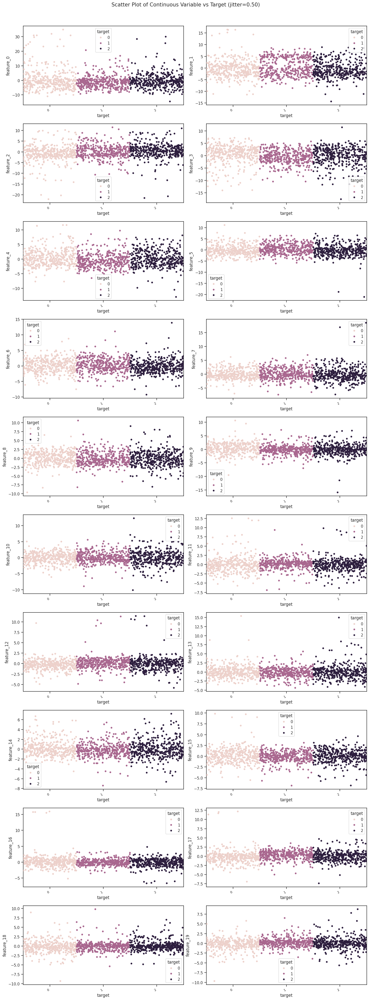

Total Number of Scatter Plots = 210


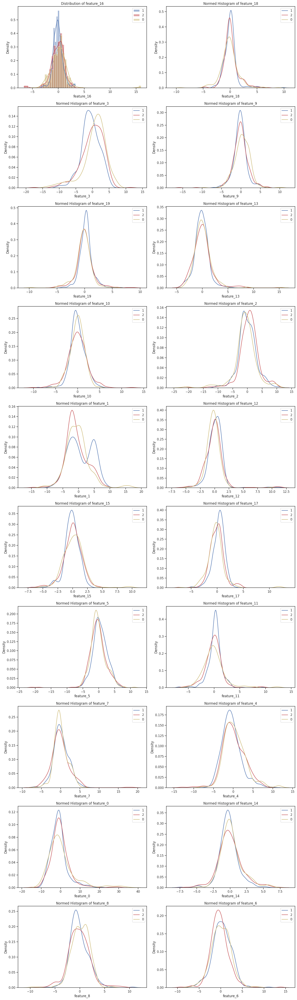

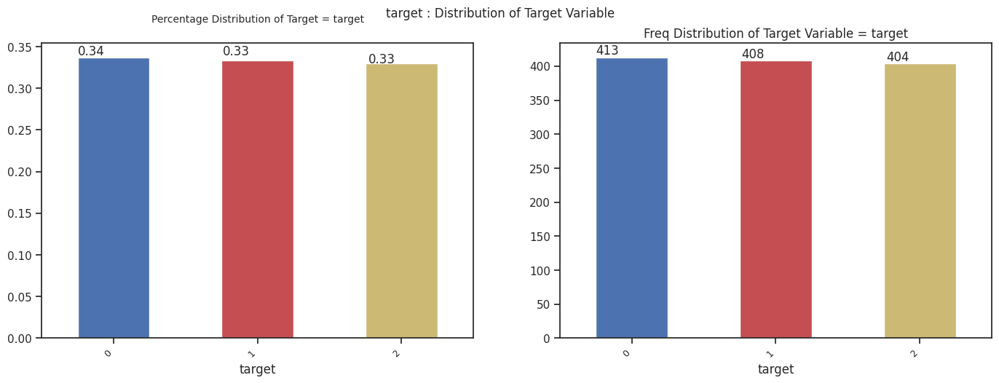

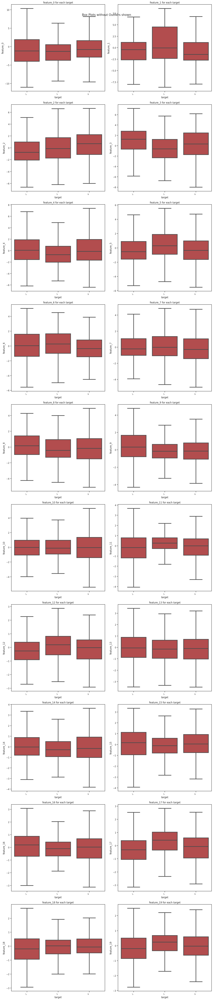

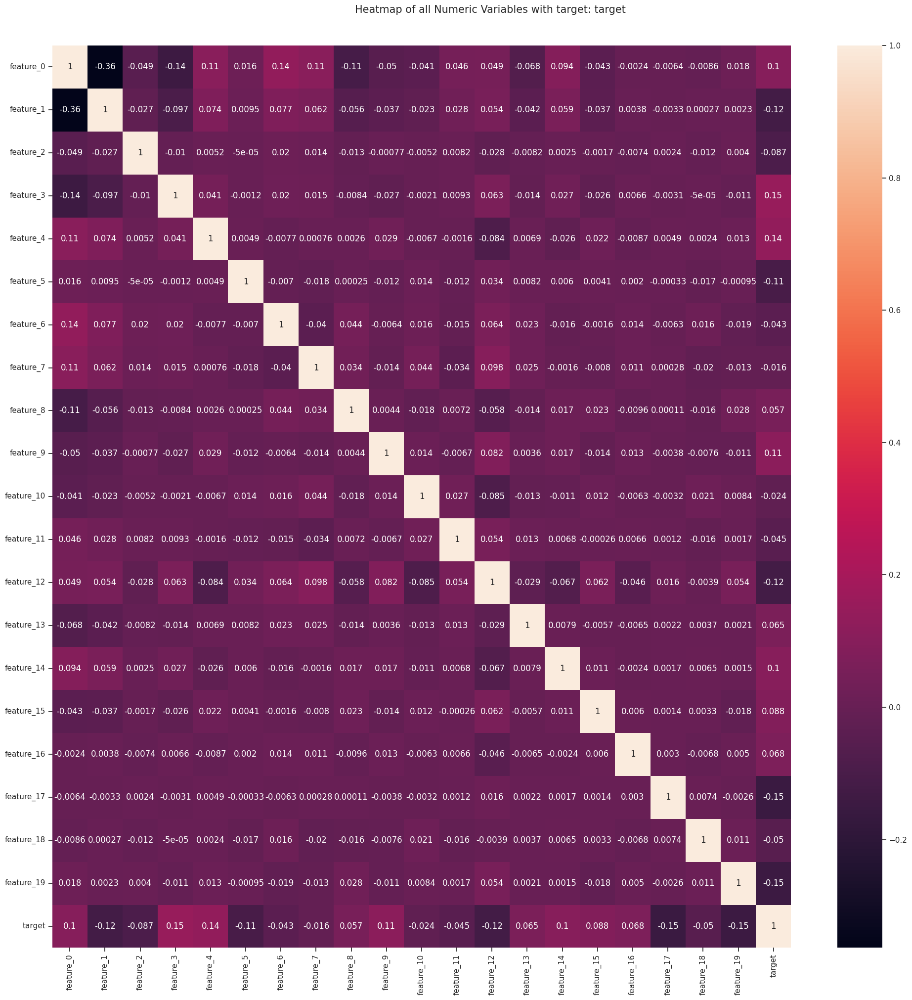

All Plots done
Time to run AutoViz = 47 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [21]:
AV = AutoViz_Class()
%matplotlib inline
dfte = AV.AutoViz('', sep=',', depVar='target', dfte=feat_df, header=0, verbose=0, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=34, save_plot_dir=None)